In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from torch.utils.data import Dataset,DataLoader

In [5]:
train_df = pd.read_csv("/kaggle/input/snakeclef2022/SnakeCLEF2022-TrainMetadata.csv")

In [6]:
train_data = train_df[(train_df["code"]=="IN") | (train_df["code"]=="BD") | (train_df["code"]=="BT") |
                      (train_df["code"]=="MV") | (train_df["code"]=="NP") | (train_df["code"]=="PK") |
                      (train_df["code"]=="LK")]

train_data['file_path']="/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/"+train_data['file_path']

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [7]:
train_data = train_data[(train_data["binomial_name"]=="Naja naja") | (train_data["binomial_name"]=="Bungarus caeruleus") |
                      (train_data["binomial_name"]=="Daboia russelii") | (train_data["binomial_name"]=="Echis carinatus") ]
train_data.shape

(1305, 7)

In [8]:
# splitting dataframe in a particular size
df_s = train_data.sample(frac=0.2,random_state=20)
df_s['valid']=True

In [9]:
snake_df=train_data.combine_first(df_s)
snake_df=snake_df.fillna(False)

In [10]:
snake_df.shape

(1305, 8)

In [11]:
z=snake_df['binomial_name'].unique()
z

array(['Daboia russelii', 'Echis carinatus', 'Naja naja',
       'Bungarus caeruleus'], dtype=object)

In [12]:
z=snake_df['binomial_name'].value_counts()
z

Naja naja             577
Daboia russelii       342
Echis carinatus       205
Bungarus caeruleus    181
Name: binomial_name, dtype: int64

In [13]:
snake_df['file_path']

1294      /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
1326      /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
1327      /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
1328      /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
1391      /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
                                ...                        
269715    /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
269716    /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
269717    /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
269718    /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
269719    /kaggle/input/snakeclef2022/SnakeCLEF2022-medi...
Name: file_path, Length: 1305, dtype: object

In [14]:
# root="/kaggle/input/snakeclef2022/SnakeCLEF2022-small_size/SnakeCLEF2022-small_size/"
# root2="/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/"
# img_path=root2+"1990/Amphiesma_stolatum/59067968.jpg"
# temp='/kaggle/input/snakeclef2022/SnakeCLEF2022-test_images/SnakeCLEF2022-large_size/111839041.jpeg'

In [15]:
# import tensorflow as tf
# img = tf.keras.preprocessing.image.load_img(temp)
# img

In [16]:
!pip install pycodestyle_magic
!pip install fastai --upgrade
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 kB 6.2 MB/s eta 0:00:0000:01
  Attempting uninstall: fastai
    Found existing installation: fastai 2.7.9
    Uninstalling fastai-2.7.9:
      Successfully uninstalled fastai-2.7.9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 kB 8.4 MB/s eta 0:00:00a 0:00:01


### Model-Transformer

In [17]:
%load_ext pycodestyle_magic
%pycodestyle_on

**Utils**

In [18]:
import json
import os
import re


def to_json(dict_, filename):
    with open(filename, 'w') as f:
        json.dump(dict_, f)


def read_json(filename):
    with open(filename, 'r') as f:
        return json.load(f)


def get_filenames_in_dir(path, file_type=None, include_path=True):
    try:
        files = [os.path.join(path, item) if include_path else item
                 for item in os.listdir(path)]
    except FileNotFoundError:
        files = []

    if file_type is not None:
        files = [item for item in files
                 if re.search(r'(\.{})$'.format(file_type), item)]
    return files



import random
import os
import numpy as np
import torch

from PIL import ImageFile


def init():
    ImageFile.LOAD_TRUNCATED_IMAGES = True


def set_random_seed(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


    
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


def create_fig(*, ntotal=None, ncols=1, nrows=1, colsize=8, rowsize=6):
    if ntotal is not None:
        nrows = int(np.ceil(ntotal / ncols))
    fig, ax_mat = plt.subplots(
        nrows, ncols, figsize=(colsize*ncols, rowsize*nrows))
    axs = np.array(ax_mat).flatten()
    if ntotal is not None and len(axs) > ntotal:
        for ax in axs[ntotal:]:
            ax.axis('off')
    if len(axs) == 1:
        axs = axs[0]
    return fig, axs


def plot_training_progress(df, x='epoch', y='train_loss', title='Training Progress',
                           xlim=[0, 30], ylim=None, annot=False, annot_nth=5, ax=None):
    if ax is None:
        fig, ax = create_fig(ncols=1, nrows=1)

    assert isinstance(x, str)
    if isinstance(y, str):
        y = [y]

    # create lineplot
    # df.plot(x=x, y=y, kind='line', marker='.',
    #         xlim=xlim, ylim=ylim, title=title, ax=ax)
    for _y in y:
        sns.lineplot(data=df, x=x, y=_y, marker='o', label=_y, ax=ax)
        ax.set(xlim=xlim, ylim=ylim, title=title)
        ax.legend()

    ax.grid()

    if annot:
        # add anotations
        idx = np.arange(len(df))
        cond = (idx % annot_nth == 0) | (idx == idx.max())
        for _, row in df[cond].iterrows():
            for metric in y:
                if ylim is None or row[metric] < ylim[1]:
                    ax.text(row[x], row[metric], f'{row[metric]:.2f}',
                            va='bottom', ha='center', fontsize='large')

    return ax


def plot_score_heatmap(groups_dict,
                       metrics=['accuracy', 'f1_score', 'country_f1_score'],
                       agg='max', cmap='Blues', ax=None):
    if ax is None:
        fig, ax = create_fig(ncols=1, nrows=1)

    # aggregate metrics based on agg argument
    df = pd.DataFrame.from_dict(
        {k: v.agg({m: agg for m in metrics}) for k, v in groups_dict.items()},
        orient='index')

    # plot heatmap
    sns.heatmap(df, annot=True, fmt='.3f', cmap=cmap, ax=ax)
    ax.set(title='Score Heatmap')
    # plt.yticks(rotation=0)
    ax.tick_params(axis='y', labelrotation=0)

    plt.show()


def compare_training_process(groups_dict, *, xlim=[0, 30]):
    first_group_df = list(groups_dict.values())[0]
    for col in ['epoch', 'train_loss', 'valid_loss',
                'accuracy', 'f1_score', 'country_f1_score']:
        assert col in first_group_df, f'Column "{col}" is missing the the dataframe'

    ngroups = len(groups_dict)
    fig, axs = create_fig(ncols=ngroups, nrows=2)

    for ax, (k, g) in zip(axs[:ngroups], groups_dict.items()):
        params = dict(y=['train_loss', 'valid_loss'], xlim=xlim, ylim=[0.0, 6.0])
        plot_training_progress(g, x='epoch', title=k, ax=ax, **params)

    for ax, (k, g) in zip(axs[ngroups:], groups_dict.items()):
        params = dict(y=['accuracy', 'f1_score', 'country_f1_score'], xlim=xlim, ylim=[0, 1])
        plot_training_progress(g, x='epoch', title=k, ax=ax, **params)

    plt.show()

**Core**

In [19]:
import torch.nn as nn
import sys

import timm


class _FunctionWrapper(object):
    def __init__(self, func, func_name):
        self.func = func
        self.func.__name__ = func_name
        self.__name__ = func_name

    def __call__(self, *args, **kwargs):
        return self.func(*args, **kwargs)

    def __str__(self):
        return self.func.__name__

    def __repr__(self):
        return str(self)


def _create_model_factory(clean_model_name, timm_model_name):
    def create_model(pretrained=False, *args, **kwargs):
        return timm.create_model(timm_model_name, pretrained, *args, **kwargs)

    return _FunctionWrapper(create_model, clean_model_name)


_model_specs = {
    'resnet50': ('tv_resnet50', 224),
    'resnet101': ('tv_resnet101', 224),

    'resnext50': ('resnext50_32x4d', 224),
    'resnext101': ('ig_resnext101_32x8d', 224),

    'resnest26': ('resnest26d', 224),
    'resnest50': ('resnest50d', 224),
    'resnest101': ('resnest101e', 256),
    'resnest200': ('resnest200e', 320),
    'resnest269': ('resnest269e', 416),

    'efficientnet_b0': ('tf_efficientnet_b0', 224),
    'efficientnet_b1': ('tf_efficientnet_b1', 240),
    'efficientnet_b2': ('tf_efficientnet_b2', 260),
    'efficientnet_b3': ('tf_efficientnet_b3', 300),
    'efficientnet_b4': ('tf_efficientnet_b4', 380),
    'efficientnet_b5': ('tf_efficientnet_b5', 456),

    'vit_base_224': ('vit_base_patch16_224', 224),
    'vit_base_384': ('vit_base_patch16_384', 384),
    'vit_large_224': ('vit_large_patch16_224', 224),
    'vit_large_384': ('vit_large_patch16_384', 384)}


# create dictionary with models
MODELS = {k: _create_model_factory(k, v[0]) for k, v in _model_specs.items()}
MODEL_INPUT_SIZES = {k: v[1] for k, v in _model_specs.items()}


# add models as attribute of this module
for k, v in MODELS.items():
    setattr(sys.modules[__name__], k, v)


def get_model_fn(model_arch):
    if callable(model_arch):
        model_fn = model_arch
    elif model_arch in MODELS:
        model_fn = MODELS[model_arch]
    else:
        raise ValueError(f'Unknown model architecture "{model_arch}".')
    return model_fn


def get_model(model_arch, n_out, pretrained=True):
    model_fn = get_model_fn(model_arch)
    model = model_fn(pretrained=pretrained)
    config = model.default_cfg
    in_features = getattr(model, config['classifier']).in_features
    setattr(model, config['classifier'], nn.Linear(in_features, n_out))
    return model


def get_model_config(model_arch):
    model_fn = get_model_fn(model_arch)
    model = model_fn(pretrained=False)
    return model.default_cfg


import torch
import torch.nn as nn
import torch.nn.functional as F

from fastai.vision.all import CrossEntropyLossFlat, LabelSmoothingCrossEntropyFlat


class F1Loss(nn.Module):
    def __init__(self, eps=1e-10):
        super().__init__()
        self.eps = eps

        self.reduction = 'mean'

    def f1_loss(self, preds, targs, macro=True):
        assert preds.ndim == 1 or preds.ndim == 2
        assert targs.ndim == 1

        if preds.ndim == 2:
            preds = F.softmax(preds, dim=1)

        # count true positives and false positives and negatives
        labels = torch.arange(preds.shape[1], device=preds.device).reshape(-1, 1)

        # # create binary versions of targets and predictions
        targs_bin = (targs == labels).to(targs.dtype)
        preds = preds.T

        # count true positives, false positives and negatives
        tp_sum = (targs_bin * preds).sum(axis=1)  # true positive
        fp_sum = ((1 - targs_bin) * preds).sum(axis=1)  # false positive
        fn_sum = (targs_bin * (1 - preds)).sum(axis=1)  # false negative

        # compute precision and recall
        precision = tp_sum / (tp_sum + fp_sum + self.eps)
        recall = tp_sum / (tp_sum + fn_sum + self.eps)

        # compute f1 loss
        f1 = 2 * precision * recall / (precision + recall + self.eps)
        f1 = f1.clamp(min=self.eps, max=1 - self.eps)

        if macro:
            f1 = torch.mean(f1)

        return 1 - f1

    def forward(self, preds, targs):
        return self.f1_loss(preds, targs)

    def decodes(self, x):
        return x.argmax(dim=1)

    def activation(self, x):
        return F.softmax(x, dim=1)


def ce_loss(*args, weight=None, **kwargs):
    return CrossEntropyLossFlat(weight=weight)


def ce_weighted_loss(country_weights, *args, **kwargs):
    def laplace_smoothing(freq):
        # bayesian approach
        probs = (freq + 1) / (freq.sum() + len(freq))
        assert abs(probs.sum() - 1) < 1e-16
        return probs

    priors = laplace_smoothing(freq=country_weights.sum(1))

    return CrossEntropyLossFlat(weight=priors)


def lsce_loss(*args, eps=0.1, weight=None, **kwargs):
    return LabelSmoothingCrossEntropyFlat(eps=eps, weight=weight)


def f1_loss(*args, **kwargs):
    return F1Loss()


LOSSES = {
    'ce': ce_loss,
    'ce_weighted': ce_weighted_loss,
    'lsce': lsce_loss,
    'f1': f1_loss
}



import numpy as np
import os

import torch
from fastai.vision.all import Path, DataBlock, ImageBlock, CategoryBlock, ColReader, ColSplitter


def get_valid_col(train_df, label_col, valid_col, *, valid_pct=0.1):
    def label_valid_col(group):
        if group.shape[0] >= 10:
            no_valid_items = int(np.floor(group.shape[0] * valid_pct))
        elif group.shape[0] >= 2:
            no_valid_items = 1
        else:
            no_valid_items = 0

        valid_mask = np.zeros(group.shape[0], dtype=bool)
        if no_valid_items > 0:
            valid_mask[-no_valid_items:] = True

        group[valid_col] = valid_mask
        return group

    return train_df.groupby(label_col).apply(label_valid_col)


def _create_dblock(fn_col, label_col, valid_col, item_tfms, batch_tfms,
                   country_col=None):
#     pref = f'{Path(path) if folder is None else Path(path)/folder}{os.path.sep}'
#     if country_col is None:
    blocks = (ImageBlock, CategoryBlock)
    n_inp = 1
    get_x = ColReader(fn_col)
    get_y = ColReader(label_col, label_delim=None)
#     else:
#     blocks = (ImageBlock, CategoryBlock, CategoryBlock)
#     n_inp = 2
#     get_x = [ColReader(fn_col),ColReader(country_col)]
#     get_y = ColReader(label_col, label_delim=None)

    dblock = DataBlock(
        blocks=blocks, n_inp=n_inp, get_x=get_x, get_y=get_y,
        splitter=ColSplitter(valid_col), item_tfms=item_tfms, batch_tfms=batch_tfms)
    return dblock


def create_dls(df, *, fn_col, label_col, valid_col,
               bs=64, item_tfms=None, batch_tfms=None,
               num_workers=4, device=torch.device('cpu'), **kwargs):
    dblock = _create_dblock(fn_col, label_col, valid_col, item_tfms, batch_tfms)
    dls = dblock.dataloaders(df, bs=bs, num_workers=num_workers, device=device, **kwargs)
    return dls, dblock


def create_country_dls(df, *, fn_col, country_col, label_col, valid_col, path='.', folder=None,
                       bs=64, item_tfms=None, batch_tfms=None,
                       num_workers=4, device=torch.device('cpu'), **kwargs):
    dblock = _create_dblock(fn_col, label_col, valid_col, path, folder, item_tfms, batch_tfms,
                            country_col)
    dls = dblock.dataloaders(df, path=path, bs=bs, num_workers=num_workers, device=device, **kwargs)
    return dls, dblock


import numpy as np
import pandas as pd


def p_r_f1_score(preds, targs, *, no_labels=None, labels=None, macro=False, eps=1e-10):
    # count true positives and false positives and negatives
    if labels is None and no_labels is not None:
        labels = np.arange(no_labels)
    elif labels is None:
        labels = np.unique(targs)
    else:
        labels = np.array(labels)

    labels = labels.reshape(-1, 1)

    # create binary versions of targets and predictions
#     targs_bin = (targs == labels).astype(targs.dtype)
#     preds_bin = (preds == labels).astype(preds.dtype)
    targs_bin = (targs == labels)
    preds_bin = (preds == labels)

    # count true positives, false positives and negatives
    tp_sum = (targs_bin * preds_bin).sum(axis=1)  # true positive
    fp_sum = ((1 - targs_bin) * preds_bin).sum(axis=1)  # false positive
    fn_sum = (targs_bin * (1 - preds_bin)).sum(axis=1)  # false negative

    # compute precision and recall
    precision = tp_sum / (tp_sum + fp_sum + eps)
    recall = tp_sum / (tp_sum + fn_sum + eps)

    # compute f1 score
    f1 = 2 * precision * recall / (precision + recall + eps)
    # f1 = f1.clamp(min=eps, max=1-eps)

    # compute support
    support = targs_bin.sum(1)

    if macro:
        precision = np.mean(precision)
        recall = np.mean(recall)
        f1 = np.mean(f1)
        support = np.sum(support)

    return precision, recall, f1, support


def f1_score(preds, targs, *, no_labels=None, labels=None, macro=False, eps=1e-10):
    _, _, f1, _ = p_r_f1_score(preds, targs, no_labels=no_labels, labels=labels,
                               macro=macro, eps=eps)
    return f1


def p_r_f1_report(preds, targs, *, no_labels=None, labels=None, label_names=None):
    if no_labels is None and label_names is not None:
        no_labels = len(label_names)
    if labels is not None and label_names is not None:
        assert len(labels) == len(label_names)

    p, r, f1, s = p_r_f1_score(preds, targs, no_labels=no_labels, labels=labels, macro=False)
    out = pd.DataFrame(
        np.array([p, r, f1, s]).T,
        columns=['precision', 'recall', 'f1-score', 'support'])
    if label_names is not None:
        out.index = label_names

    return out


def test_p_r_f1_score(preds, targs, no_labels):
    from sklearn.metrics import classification_report

    # create classification report with sklearn
    report = classification_report(targs, preds, output_dict=True, zero_division=0)
    report_df = pd.DataFrame(report).T

    # create custom classification report
    p, r, f1, s = p_r_f1_score(preds, targs, no_labels=no_labels, macro=False)
    custom_report_df = pd.DataFrame(
        np.array([p, r, f1, s]).T, index=np.arange(no_labels),
        columns=['Custom precision', 'Custom recall', 'Custom f1-score', 'Custom support'])

    # merge reports and test equality of each class
    _report_df = report_df.iloc[:-3].copy()
    _report_df.index = _report_df.index.astype(int)
    report_df_2 = pd.concat([_report_df, custom_report_df], axis=1).sort_index()
    report_df_2 = report_df_2[report_df_2['Custom support'] != 0]

    for col in ['precision', 'recall', 'f1-score', 'support']:
        assert np.allclose(report_df_2[col], report_df_2['Custom ' + col])

    # test equality of macro metrics
    mp, mr, mf1, ms = p_r_f1_score(preds, targs, labels=_report_df.index.values, macro=True)
    assert np.allclose(report_df.loc['macro avg'], (mp, mr, mf1, ms))


def clean_country_map(country_map_df, species, countries=None, *, missing_val=0, verbose=0):
    from pprint import pprint

    out = country_map_df.copy()

    # add misssing species
    missing_species = {i: item for i, item in enumerate(species) if item not in out.index}
    if verbose:
        print('Missing Species:')
        pprint(missing_species)

    for item in missing_species.values():
        out.loc[item] = missing_val

    if countries is not None:
        # add missing countries
        missing_countries = {i: item for i, item in enumerate(countries) if item not in out.columns}
        if verbose:
            print('\nMissing Countries:')
            pprint(missing_countries)

        for item in missing_countries.values():
            out[item] = missing_val

    # remove duplicate countries
    dup = out.columns.duplicated()
    for col in out.columns[dup]:
        series = out[col].apply(lambda x: np.sign(np.sum(x)), axis=1)
        out.drop(columns=[col], inplace=True)
        out[col] = series

    if countries is not None:
        # keep only needed species and countries in correct order
        out = out.loc[species, countries]
        assert out.shape == (len(species), len(countries)), out.shape
    else:
        # keep only needed species in correct order
        out = out.loc[species]
        assert out.shape[0] == len(species), out.shape

    return out


def country_f1_score(preds, targs, country_weights):
    no_labels = country_weights.shape[0]
    assert np.all(preds < no_labels), 'Unexpected class (label) in prediction array'
    assert np.all(targs < no_labels), 'Unexpected class (label) in target array'

    # compute f1 score on species level
    _, _, f1, _ = p_r_f1_score(preds, targs, no_labels=no_labels, macro=False)
    assert f1.shape[0] == country_weights.shape[0]

    # compute country f1 score
    f1_country = (f1.reshape(-1, 1) * country_weights).sum(axis=0) / country_weights.sum(axis=0)
    f1_country[np.isnan(f1_country)] = .0  # replace nans with 0

    # compute macro averaged country f1 score
    macro_f1_country = f1_country.mean()

    return macro_f1_country

**metrics**

In [20]:
import torch

from fastai.vision.all import AccumMetric


def accuracy(preds, targs):
    assert preds.ndim == 1 or preds.ndim == 2
    assert targs.ndim == 1

    if preds.ndim == 2:
        preds = preds.argmax(dim=1)
    
    return (preds == targs).float().mean()


def f1_score(preds, targs, *, no_labels=None, labels=None, macro=False, eps=1e-10):
    assert preds.ndim == 1 or preds.ndim == 2
    assert targs.ndim == 1

    if preds.ndim == 2:
        no_labels = preds.shape[1]
        preds = preds.argmax(dim=1)

    # count true positives and false positives and negatives
    if labels is None and no_labels is not None:
        labels = torch.arange(no_labels, device=preds.device)
    elif labels is None:
        labels = torch.unique(torch.cat([targs, preds]))

    labels = labels.reshape(-1, 1)

    # create binary versions of targets and predictions
#     targs_bin = (targs == labels).to(targs.dtype)
#     preds_bin = (preds == labels).to(preds.dtype)
    targs_bin = (targs == labels)*1
    preds_bin = (preds == labels)*1

    # count true positives, false positives and negatives
    tp_sum = (targs_bin * preds_bin).sum(axis=1)  # true positive
    fp_sum = ((1 - targs_bin) * preds_bin).sum(axis=1)  # false positive
    fn_sum = (targs_bin * (1 - preds_bin)).sum(axis=1)  # false negative

    # compute precision and recall
    precision = tp_sum / (tp_sum + fp_sum + eps)
    recall = tp_sum / (tp_sum + fn_sum + eps)

    # compute f1 score
    f1 = 2 * precision * recall / (precision + recall + eps)
    # f1 = f1.clamp(min=eps, max=1-eps)

    # # compute support
    # support = targs_bin.sum(1)

    if macro:
        # precision = torch.mean(precision)
        # recall = torch.mean(recall)
        f1 = torch.mean(f1)
        # support = torch.sum(support)

    # print(f1.item())
    # import fastai
    # print('\t', fastai.vision.all.F1Score(average='macro')(preds, targs))

    return f1


def country_f1_score(preds, targs, country_weights):
    country_weights = country_weights.to(preds.device)

    no_labels = country_weights.shape[0]
    assert torch.all(preds < no_labels), 'Unexpected class (label) in prediction array'
    assert torch.all(targs < no_labels), 'Unexpected class (label) in target array'

    # compute f1 score on species level
    f1 = f1_score(preds, targs, no_labels=no_labels, macro=False)
    assert f1.shape[0] == country_weights.shape[0]

    # compute country f1 score
    f1_country = (f1.reshape(-1, 1) * country_weights).sum(axis=0) / country_weights.sum(axis=0)
    f1_country[torch.isnan(f1_country)] = .0  # replace nans with 0

    # compute macro averaged country f1 score
    macro_f1_country = f1_country.mean()

    return macro_f1_country


def F1Score(no_labels=None, labels=None):
    return AccumMetric(f1_score, dim_argmax=1, no_labels=no_labels, labels=labels, macro=True)


def CountryF1Score(country_weights):
    return AccumMetric(country_f1_score, dim_argmax=1, country_weights=country_weights)



**Dev**

In [21]:
from datetime import datetime

# from src.core import models, loss_functions
# from src.utils import io


class Config:
    def __init__(self, filename=None):
        self._config = {}
        if filename is not None:
            dict_ = io.read_json(filename)
            for k, v in dict_.items():
                self[k] = v

    def __getitem__(self, key):
        return self._config[key]

    def __setitem__(self, key, value):
        self._config[key] = value
        setattr(self, key, value)

    def __iter__(self):
        return iter(self._config.items())

    def __repr__(self):
        out = 'Config('
        for k, v in self:
            out += f'\n* {k}: {v}'
        out += ')'
        return out

    def save(self, filename):
        to_json(self._config, filename)

    @staticmethod
    def from_dict(dict_):
        obj = Config()
        for k, v in dict_.items():
            obj[k] = v
        return obj


def create_config(*, model, loss, **kwargs):
#     assert model in models.MODELS
#     assert loss in loss_functions.LOSSES

    # create names of output file
    now = datetime.now().strftime('%m-%d-%Y_%H-%M')
    model_name = f'clef2021_{model}_{loss}_{now}'
    history_name = f'{model_name}.csv'
    specs_name = f'{model_name}.json'

    # create dictionary with parameters of the experiment
    d = dict(
        model_name=model_name,
        history_file=history_name,
        specs_name=specs_name,
        model=model,
        loss=loss,
        **kwargs)
    config = Config.from_dict(d)

    return config

In [22]:
import torch
from fastai.vision.all import (ToTensor, Normalize, Resize,
                               Learner, CSVLogger, SaveModelCallback, GradientAccumulation,
                               Adam, SGD)

# from src.core import models, loss_functions, metrics, data, augmentation as aug
# from src.utils import nb_setup, io
# from src.dev import experiments as exp


DATA_DIR = 'data/snake_clef2021_dataset/'
TRAIN_SET_DIR = 'train'

SEED = 42

# nb_setup.init()
# nb_setup.set_random_seed(SEED)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cuda


### BUILDING MODEL

### RESNEST101

In [30]:
no_classes = len(snake_df['binomial_name'].drop_duplicates())
print('No classes:', no_classes)

No classes: 4


In [31]:
config = create_config(
    model='resnest101',
    loss='ce',
    opt='sgd',
    no_epochs=50,
    batch_size=128,
    total_batch_size=128,
    learning_rate=0.01,
    wd=0.01,
    full_ds=False,
    aug=False,
    scheduler=False,
    mixed_precision=True,
    # note=''
)

config['input_size'] = MODEL_INPUT_SIZES[config.model]
_model_config = get_model_config(config.model)
config['model_mean'] = _model_config['mean']
config['model_std'] = _model_config['std']

loss_fn =LOSSES[config.loss]
OPTIMS = {
    'adam': Adam,
    'sgd': lambda *a, **k: SGD(*a, mom=0.9, **k)}
opt_fn = OPTIMS[config.opt]

# print(config)
config

Config(
* model_name: clef2021_resnest101_ce_02-03-2023_20-22
* history_file: clef2021_resnest101_ce_02-03-2023_20-22.csv
* specs_name: clef2021_resnest101_ce_02-03-2023_20-22.json
* model: resnest101
* loss: ce
* opt: sgd
* no_epochs: 50
* batch_size: 128
* total_batch_size: 128
* learning_rate: 0.01
* wd: 0.01
* full_ds: False
* aug: False
* scheduler: False
* mixed_precision: True
* input_size: 256
* model_mean: (0.485, 0.456, 0.406)
* model_std: (0.229, 0.224, 0.225))

In [32]:
species = np.unique(train_df['binomial_name'])
countries = np.unique(train_df['country'])

# load country-species map, country-country LuT and rename countries
country_map_df = pd.read_csv('/kaggle/input/hgukgukhi/species_to_country_mapping.csv', index_col=0)

# create country weight matrix
country_weights = clean_country_map(country_map_df, species, missing_val=0)
country_weights = torch.Tensor(country_weights.values).to(device)

In [33]:
snake_df.head()

,binomial_name,class_id,code,country,endemic,file_path,observation_id,valid
1294,Daboia russelii,415,IN,Maharashtra,False,/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2003/Daboia_russelii/87132268.jpeg,54747641,False
1326,Echis carinatus,521,IN,Gujarat,False,/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2003/Echis_carinatus/126272576.jpg,77219002,False
1327,Echis carinatus,521,IN,Gujarat,False,/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2003/Echis_carinatus/126272760.jpg,77219002,False
1328,Echis carinatus,521,IN,Gujarat,False,/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2003/Echis_carinatus/126272646.jpg,77219002,False
1391,Daboia russelii,415,IN,Maharashtra,False,/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2003/Daboia_russelii/87083111.jpeg,54717670,False


#### DEFINE TRANSFORMS & CREATING IMAGE DATA LOADERS

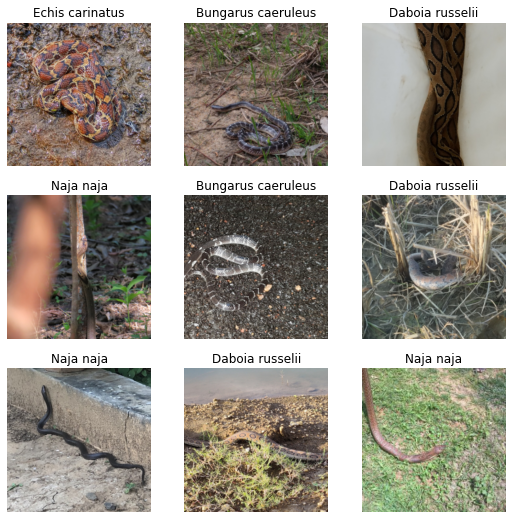

In [34]:
#define transforms
item_tfms = [ToTensor, Resize(config.input_size)]
if config.aug:
    batch_tfms = [*aug.get_simple_tfms(),
                  Normalize.from_stats(config.model_mean, config.model_std)]
else:
    batch_tfms = Normalize.from_stats(config.model_mean, config.model_std)


    # create image data loaders
dblock = DataBlock(
  blocks=(ImageBlock, *(1*[CategoryBlock])),      # one image input and three categorical targets
  getters=[ColReader('file_path'),   # image input
#                ColReader('code'), 
           ColReader('binomial_name')
           # label 1
         ],                     # label 3
  splitter=ColSplitter('valid'),               # train/validation split
  batch_tfms=batch_tfms,item_tfms=item_tfms) 



dls = dblock.dataloaders(snake_df, bs=32)

dls.show_batch()

#### CREATING CSV LOGGER & MODEL CALLBACKS

In [35]:
csv_logger_cb = CSVLogger(fname=config.history_file, append=True)
save_model_cb = SaveModelCallback(
    monitor='country_f1_score', fname=config.model_name)
grad_accum_cb = GradientAccumulation(n_acc=config.total_batch_size)

#### CREATING MODEL LEARNER

In [36]:
learner = Learner(
    dls,
    model=get_model(config.model, no_classes, pretrained=True),
    loss_func=loss_fn(country_weights=country_weights),
    opt_func=opt_fn,
    metrics=[accuracy,
             F1Score(),
             CountryF1Score(country_weights)],
    cbs=[csv_logger_cb, save_model_cb, grad_accum_cb])
learner.unfreeze()

if config.mixed_precision:
    learner = learner.to_fp16()

### TRAINING THE MODEL

epoch,train_loss,valid_loss,accuracy,f1_score,country_f1_score,time
0,0.994914,0.583848,0.823755,0.788391,0.000627,00:44
1,0.591798,0.365791,0.885057,0.872446,0.000709,00:36
2,0.349685,0.395094,0.885057,0.867330,0.000703,00:36
3,0.213531,0.450597,0.850575,0.831528,0.000672,00:37
4,0.131339,0.352327,0.877395,0.856705,0.000694,00:36
5,0.080724,0.427650,0.885057,0.870984,0.000709,00:36
6,0.053304,0.356206,0.885057,0.874906,0.000715,00:37
7,0.034507,0.363641,0.885057,0.873694,0.000713,00:36
8,0.026319,0.354333,0.892720,0.882668,0.000722,00:37
9,0.017721,0.355603,0.904215,0.894722,0.000733,00:37


Better model found at epoch 0 with country_f1_score value: 0.000627045170404017.
Better model found at epoch 1 with country_f1_score value: 0.0007092235027812421.
Better model found at epoch 5 with country_f1_score value: 0.0007094615721143782.
Better model found at epoch 6 with country_f1_score value: 0.0007149114971980453.
Better model found at epoch 8 with country_f1_score value: 0.0007224567234516144.
Better model found at epoch 9 with country_f1_score value: 0.0007325849728658795.
Better model found at epoch 12 with country_f1_score value: 0.0007355699199251831.
Better model found at epoch 17 with country_f1_score value: 0.0007455358863808215.
Better model found at epoch 25 with country_f1_score value: 0.0007457046303898096.
Better model found at epoch 33 with country_f1_score value: 0.0007507490226998925.
Better model found at epoch 46 with country_f1_score value: 0.0007607015431858599.


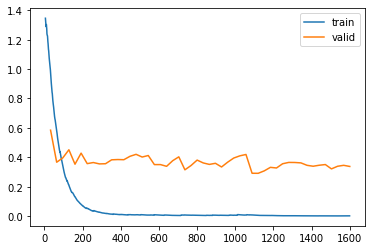

In [37]:
if config.scheduler:
    learner.fit_one_cycle(config.no_epochs, lr_max=config.learning_rate,
                          wd=config.wd)
else:
    learner.fit(config.no_epochs, lr=config.learning_rate, wd=config.wd)

# plot loss history
learner.recorder.plot_loss()

#### THE ACCURACY OF THE MODEL IS FOUND OUT TO BE 92.72%.

In [38]:
learner.save('MyModel', with_opt=False)

Path('models/MyModel.pth')

### PREDICTION

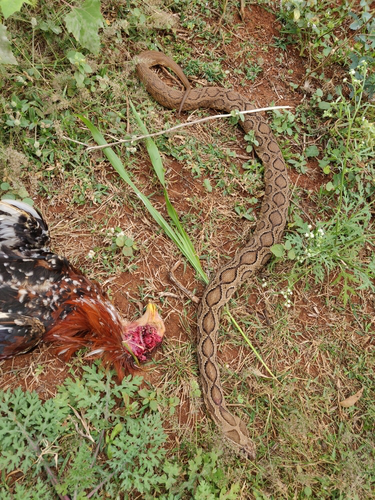

In [67]:
from PIL import Image
im = Image.open("/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2022/Daboia_russelii/178667273.jpeg")
im.load()
im

In [73]:
pred=learner.predict("/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2022/Daboia_russelii/178667273.jpeg")
print("PREDICTED Snake Species:",pred[0])

PREDICTED Snake Species: Daboia russelii


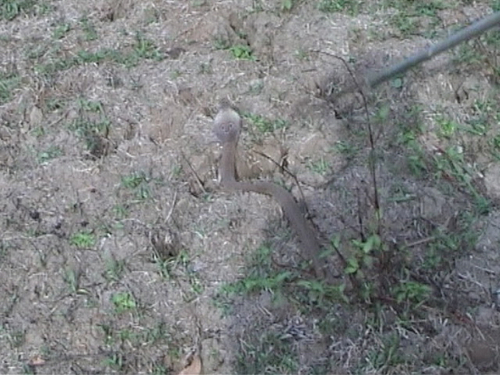

In [70]:
im2 = Image.open("/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2004/Naja_naja/163559488.jpeg")
im2.load()
im2

In [72]:
pred2=learner.predict("/kaggle/input/snakeclef2022/SnakeCLEF2022-medium_size/SnakeCLEF2022-medium_size/2004/Naja_naja/163559488.jpeg")
print("PREDICTED Snake Species:",pred2[0])

PREDICTED Snake Species: Naja naja


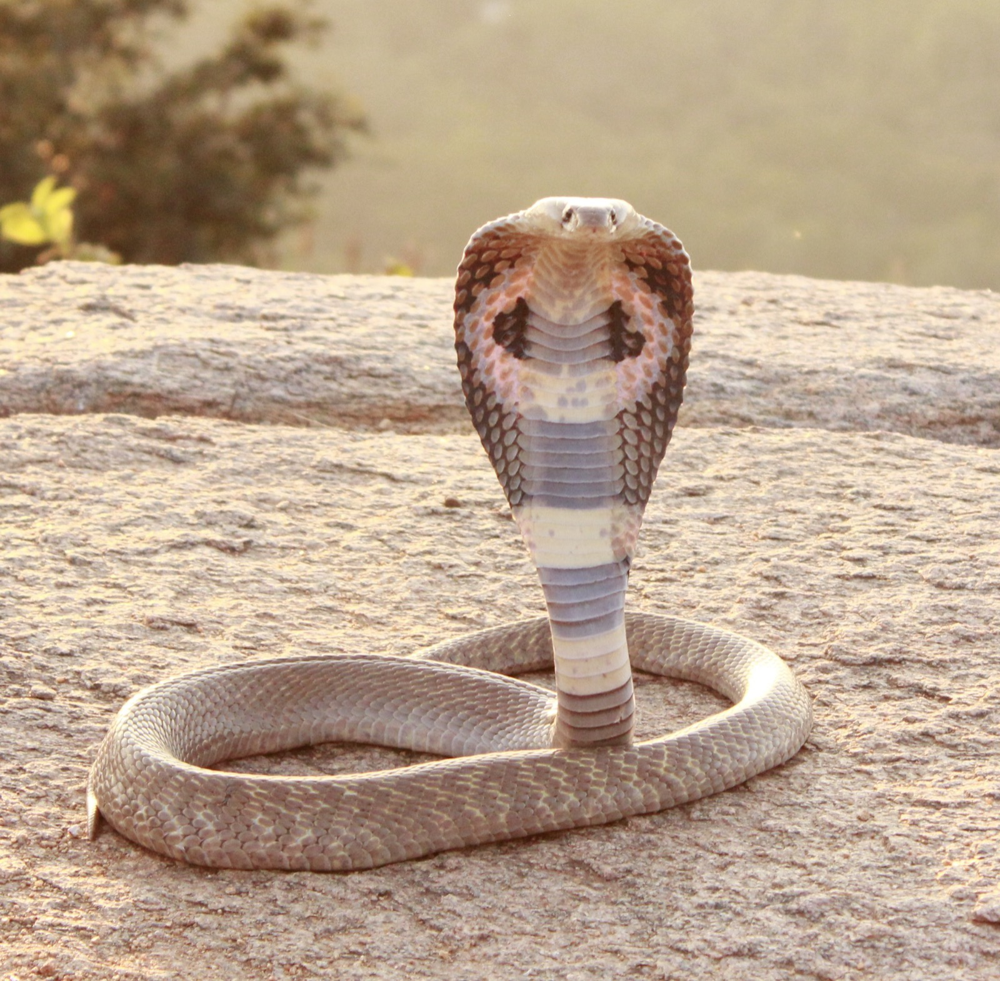

In [76]:
im3 = Image.open("/kaggle/input/snake-images/WhatsApp Image 2023-02-03 at 8.27.53 PM.jpeg")
im3.load()
im3

In [77]:
pred3=learner.predict("/kaggle/input/snake-images/WhatsApp Image 2023-02-03 at 8.27.53 PM.jpeg")
print("PREDICTED Snake Species:",pred3[0])

PREDICTED Snake Species: Naja naja


PREDICTED Snake Species: Daboia russelii


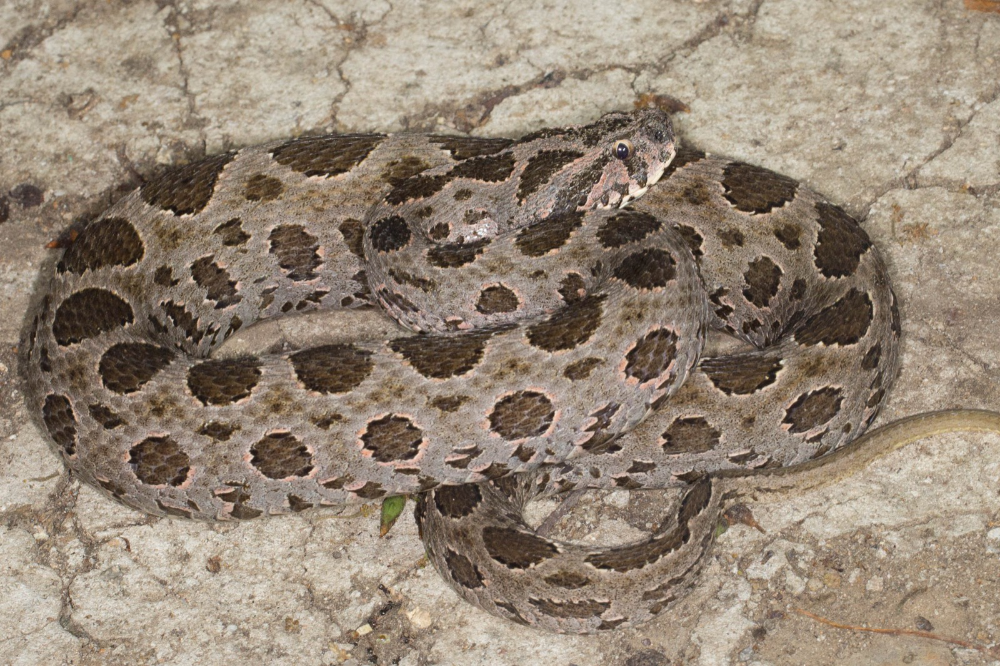

In [80]:
im4 = Image.open("/kaggle/input/snake-images/WhatsApp Image 2023-02-03 at 8.29.14 PM.jpeg")
im4.load()
pred4=learner.predict("/kaggle/input/snake-images/WhatsApp Image 2023-02-03 at 8.29.14 PM.jpeg")
print("PREDICTED Snake Species:",pred4[0])
im4